In [1]:
import cv2
import numpy as np
import imageio
from tqdm.notebook import tqdm


In [2]:
input_dir = '/home/ekaterina/Work/Dataset/ADE20K_semantic_segmentation/ADE20K_2016_07_26/images/training/a/abbey/'

image0_path = 'ADE_train_00000970.jpg'

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

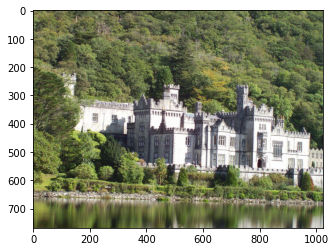

In [4]:
img = imageio.imread(input_dir+image0_path)
plt.imshow(img)

In [5]:
img.shape

(768, 1024, 3)

In [6]:
plt.rcParams["figure.figsize"] = (20,25)


In [11]:
def increase_brightness(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    value = np.random.randint(20, size=1)[0]
    
    vValue = hsv[...,2]
    hsv[...,2] = np.where((255-vValue)<value,255,vValue+value)
    
    value = np.random.randint(50, size=1)[0]/100+0.5
    
    hsv[...,2] = hsv[...,2]*value
    
    img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return img
def blur_rand_place(img):
    
    numb = np.random.randint(15, size=1)[0]+5
    
    for i in range(numb):
    
        h = np.random.randint(img.shape[0]//6, size=1)[0]+10
        y = np.random.randint(img.shape[0], size=1)[0]
        
        w = np.random.randint(img.shape[1]//6, size=1)[0]+10
        x = np.random.randint(img.shape[1], size=1)[0]

        y0 = y
        y1 = min(y+h,img.shape[0])
        x0 = x
        x1 = min(x+w, img.shape[1])

        img[y0:y1, x0:x1] = cv2.blur(img[y0:y1, x0:x1] ,(5,5))
        
    return img
        


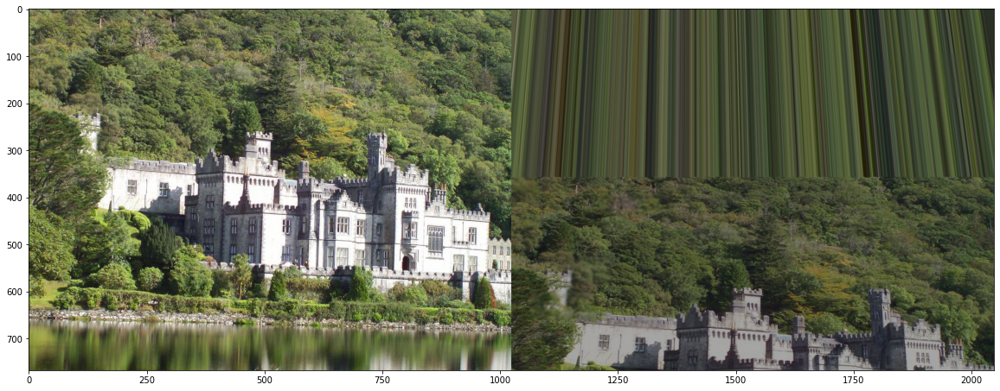

In [16]:
randp_x0, randp_x1 = np.random.randint(img.shape[0]//6, size=2)
randp_y0, randp_y1 = np.random.randint(img.shape[1]//8, size=2)

znack = np.random.randint(2, size=4)
znack = (znack-1)*2+1

randp_x0 *=znack[0]
randp_x1 *=znack[1]
randp_y0 *=znack[2]
randp_y1 *=znack[3]

pts1 = np.float32([[randp_x0,randp_y0],[img.shape[0]-randp_x0,randp_y0],
                   [img.shape[0]-randp_x1,img.shape[1]-randp_y1],[randp_x1,img.shape[1]-randp_y1]])
pts2 = np.float32([[0,0],[img.shape[0],0],[img.shape[0],img.shape[1]],[0,img.shape[1]]])

M = cv2.getPerspectiveTransform(pts1,pts2)

dst = cv2.warpPerspective(img,M,(img.shape[1],img.shape[0]),borderMode = cv2.BORDER_REPLICATE)
dst = increase_brightness(dst)
dst = blur_rand_place(dst)
plt.imshow(np.concatenate([img,dst],axis=1))
plt.show()

In [ ]:
1/4

In [8]:
import sys 
sys.path.append('../SuperGluePretrainedNetwork/')

from pathlib import Path
import argparse
import random
import numpy as np
import matplotlib.cm as cm
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

from models.matching import Matching
from models.utils import (compute_pose_error, compute_epipolar_error,
                          estimate_pose, make_matching_plot,
                          error_colormap, AverageTimer, pose_auc,
                          rotate_intrinsics, rotate_pose_inplane,
                          scale_intrinsics,process_resize,frame2tensor)
device = 'cuda' if torch.cuda.is_available() and not opt.force_cpu else 'cpu'



In [9]:
NMS_RADIUS = 3
KEYPOINT_THRESHOLD = 5e-3
MAX_KEYPOINTS = 4096
WEIGHTS = 'outdoor'
SINKHORN_ITERATIONS = 100
MATCH_THRESHOLD = 0.2
RESIZE = [1500]
RESIZE_FLOAT = False
ROT0 = 0
ROT1 = 0

config = {
        'superpoint': {
            'nms_radius': NMS_RADIUS,
            'keypoint_threshold': KEYPOINT_THRESHOLD,
            'max_keypoints': MAX_KEYPOINTS
        },
        'superglue': {
            'weights': WEIGHTS,
            'sinkhorn_iterations': SINKHORN_ITERATIONS,
            'match_threshold': MATCH_THRESHOLD,
        }
    }
matching = Matching(config).eval().to(device)
torch.set_grad_enabled(False)

Loaded SuperPoint model
Loaded SuperGlue model ("outdoor" weights)


In [10]:
def read_image(image, device, resize, rotation, resize_float):

    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    if image is None:
        return None, None, None
    w, h = image.shape[1], image.shape[0]
    w_new, h_new = process_resize(w, h, resize)
    scales = (float(w) / float(w_new), float(h) / float(h_new))

    if resize_float:
        image = cv2.resize(image.astype('float32'), (w_new, h_new))
    else:
        image = cv2.resize(image, (w_new, h_new)).astype('float32')

    if rotation != 0:
        image = np.rot90(image, k=rotation)
        if rotation % 2:
            scales = scales[::-1]

    inp = frame2tensor(image, device)
    return image, inp, scales


In [11]:
image0, inp0, scales0 = read_image(img, device, RESIZE, ROT0, RESIZE_FLOAT)
image1, inp1, scales1 = read_image(dst, device, RESIZE, ROT1, RESIZE_FLOAT)

In [12]:
%matplotlib inline

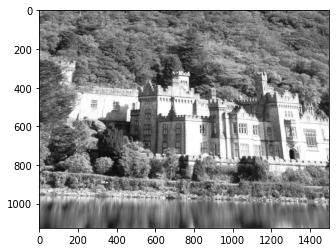

In [13]:
plt.imshow(image1, cmap='Greys_r')

In [14]:
pred = matching({'image0': inp0, 'image1': inp1})
pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
kpts0, kpts1 = pred['keypoints0'], pred['keypoints1']
matches, conf = pred['matches0'], pred['matching_scores0']
# Write the matches to disk.
out_matches = {'keypoints0': kpts0, 'keypoints1': kpts1,
               'matches': matches, 'match_confidence': conf}

In [15]:
valid = matches > -1
mkpts0 = kpts0[valid]
mkpts1 = kpts1[matches[valid]]

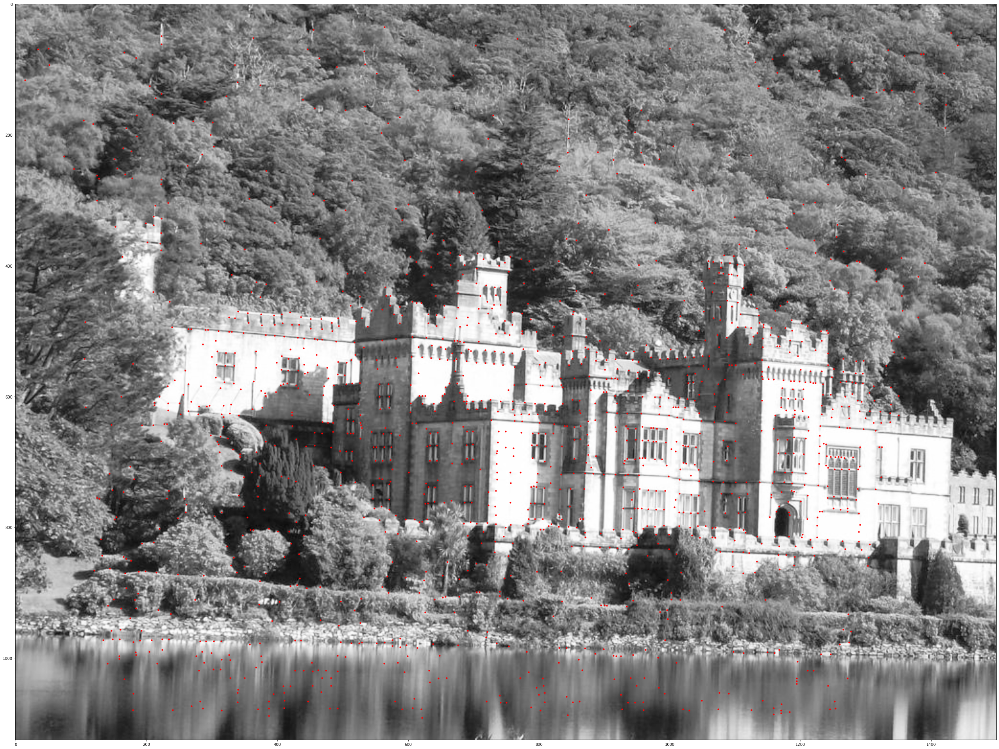

In [16]:
fig, ax = plt.subplots(figsize=(45, 40))
ax.imshow(image0, cmap='Greys_r')
ax.scatter(mkpts0[:, 0], mkpts0[:, 1], s=10, c='r')

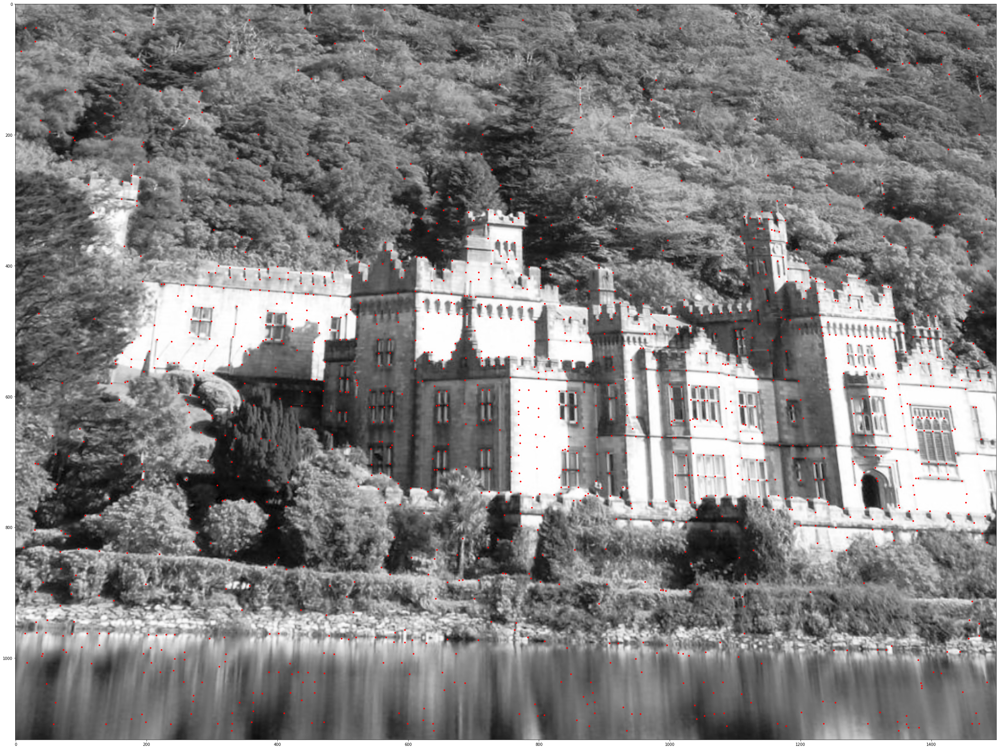

In [17]:
fig, ax = plt.subplots(figsize=(45, 40))
ax.imshow(image1, cmap='Greys_r')
ax.scatter(mkpts1[:, 0], mkpts1[:, 1], s=10, c='r')

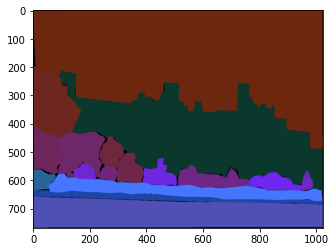

In [19]:
image0_mask_path = 'ADE_train_00000970_seg.png'
mask0 = imageio.imread(input_dir+image0_mask_path)
plt.imshow(mask0)

In [20]:
mask0

Array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [110,  39,  15],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[110,  39,  15],
        [110,  39,  15],
        [110,  39,  15],
        ...,
        [110,  39,  15],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[110,  39,  15],
        [110,  39,  15],
        [110,  39,  15],
        ...,
        [110,  39,  15],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [ 80,  80, 180],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [ 80,  80, 180],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]

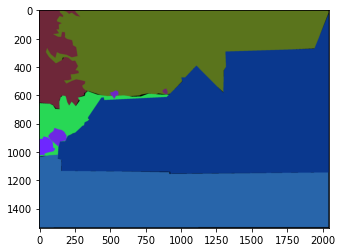

In [21]:
image0_mask_path = 'ADE_train_00000974_seg.png'
mask1 = imageio.imread(input_dir+image0_mask_path)
plt.imshow(mask1)

In [22]:
mask1

Array([[[  0,   0,   0],
        [  0,   0,   0],
        [110,  39,  57],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [110,  39,  57],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [110,  39,  57],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]]

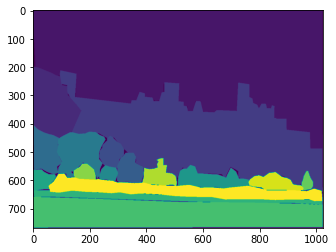

In [25]:
plt.imshow(mask0[...,-1])

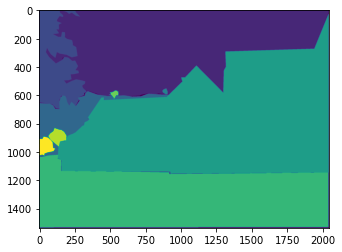

In [26]:
plt.imshow(mask1[...,-1])

In [8]:
import sys
sys.path.append('../RANSAC-Flow/semantic_segmentation_pytorch/')

import torch
import torch.nn as nn
from PIL import Image

from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.lib.nn import user_scattered_collate, async_copy_to
from mit_semseg.lib.utils import as_numpy
import numpy as np
import imageio
import cv2
from mit_semseg.utils import colorEncode, find_recursive
from scipy.io import loadmat
import matplotlib.pyplot as plt 
%matplotlib inline

In [9]:
torch.cuda.set_device(-1)

# Network Builders
net_encoder = ModelBuilder.build_encoder(
        arch='resnet50dilated',
        fc_dim=2048,
        weights= '../RANSAC-Flow/model/pretrained/ade20k_resnet50dilated_encoder.pth')
net_decoder = ModelBuilder.build_decoder(
        arch='ppm_deepsup',
        fc_dim=2048,
        num_class=150,
        weights='../RANSAC-Flow/model/pretrained/ade20k_resnet50dilated_decoder.pth',
        use_softmax=True)

crit = nn.NLLLoss(ignore_index=-1)

segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

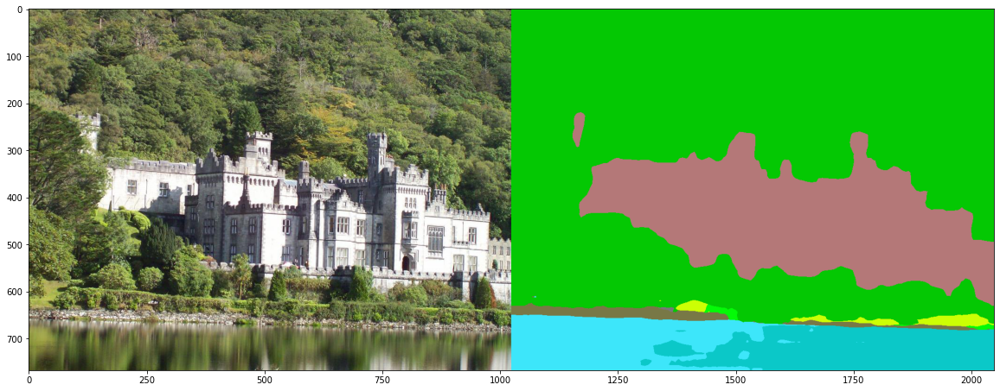

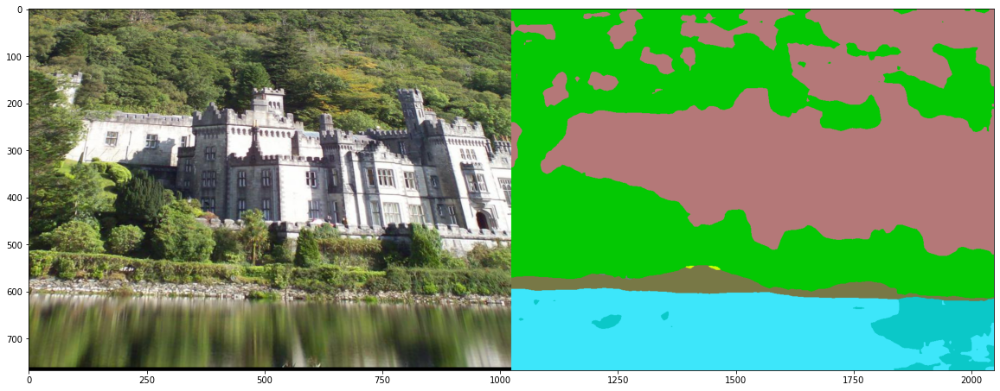

In [10]:

image0 = img.copy()

imgSizes=(300, 375, 450, 525, 600)

segSize = (image0.shape[0],
                   image0.shape[1])
img_resized = torch.from_numpy(image0[None,...]/255.).permute(0, 3, 1, 2)


colors = loadmat('../RANSAC-Flow/quick_start/color150.mat')['colors']

with torch.no_grad():
    scores = torch.zeros(1, 150, segSize[0], segSize[1])
    scores = async_copy_to(scores, -1)
    
    feed_dict={'img_data': img_resized.float()}

    #feed_dict = async_copy_to(feed_dict, -1)

    # forward pass
    pred_tmp = segmentation_module(feed_dict, segSize=segSize)
    scores = scores + pred_tmp / len(imgSizes)

    _, pred = torch.max(scores, dim=1)
    pred = as_numpy(pred.squeeze(0).cpu())
    
    pred_color0 = colorEncode(pred, colors).astype(np.uint8)
    
image1 = dst.copy()

imgSizes=(300, 375, 450, 525, 600)

segSize = (image1.shape[0],
                   image1.shape[1])
img_resized = torch.from_numpy(image1[None,...]/255.).permute(0, 3, 1, 2)


with torch.no_grad():
    scores = torch.zeros(1, 150, segSize[0], segSize[1])
    scores = async_copy_to(scores, -1)
    
    feed_dict={'img_data': img_resized.float()}

    #feed_dict = async_copy_to(feed_dict, -1)

    # forward pass
    pred_tmp = segmentation_module(feed_dict, segSize=segSize)
    scores = scores + pred_tmp / len(imgSizes)

    _, pred = torch.max(scores, dim=1)
    pred = as_numpy(pred.squeeze(0).cpu())
    
    pred_color1 = colorEncode(pred, colors).astype(np.uint8)
    
im_vis0 = np.concatenate((image0, pred_color0), axis=1)
im_vis1 = np.concatenate((image1, pred_color1), axis=1)


plt.figure(figsize=(20, 20))
plt.imshow(im_vis0)
plt.show()


plt.figure(figsize=(20, 20))
plt.imshow(im_vis1)
plt.show()

In [11]:
%matplotlib inline
from graphviz import Digraph

import torch.nn.functional as F
from torch.autograd import Variable
from torch.autograd import Variable


def make_dot(var, params):
    """ Produces Graphviz representation of PyTorch autograd graph
    
    Blue nodes are the Variables that require grad, orange are Tensors
    saved for backward in torch.autograd.Function
    
    Args:
        var: output Variable
        params: dict of (name, Variable) to add names to node that
            require grad (TODO: make optional)
    """
    param_map = {id(v): k for k, v in params.items()}
    print(param_map)
    
    node_attr = dict(style='filled',
                     shape='box',
                     align='left',
                     fontsize='12',
                     ranksep='0.1',
                     height='0.2')
    dot = Digraph(node_attr=node_attr, graph_attr=dict(size="12,12"))
    seen = set()
    
    def size_to_str(size):
        return '('+(', ').join(['%d'% v for v in size])+')'

    def add_nodes(var):
        if var not in seen:
            if torch.is_tensor(var):
                dot.node(str(id(var)), size_to_str(var.size()), fillcolor='orange')
            elif hasattr(var, 'variable'):
                u = var.variable
                node_name = '%s\n %s' % (param_map.get(id(u)), size_to_str(u.size()))
                dot.node(str(id(var)), node_name, fillcolor='lightblue')
            else:
                dot.node(str(id(var)), str(type(var).__name__))
            seen.add(var)
            if hasattr(var, 'next_functions'):
                for u in var.next_functions:
                    if u[0] is not None:
                        dot.edge(str(id(u[0])), str(id(var)))
                        add_nodes(u[0])
            if hasattr(var, 'saved_tensors'):
                for t in var.saved_tensors:
                    dot.edge(str(id(t)), str(id(var)))
                    add_nodes(t)
    add_nodes(var.zero_grad)
    return dot




g = make_dot(segmentation_module.encoder,segmentation_module.encoder.state_dict())

{139937557794400: 'conv1.weight', 139937557794560: 'bn1.weight', 139937557794640: 'bn1.bias', 139937557794720: 'bn1.running_mean', 139937557827744: 'bn1.running_var', 139937557827824: 'bn1.num_batches_tracked', 139937557827984: 'bn1._tmp_running_mean', 139937557828144: 'bn1._tmp_running_var', 139937557828304: 'bn1._running_iter', 139937557828624: 'conv2.weight', 139937557828784: 'bn2.weight', 139937557828864: 'bn2.bias', 139937557828944: 'bn2.running_mean', 139937557829104: 'bn2.running_var', 139937557829184: 'bn2.num_batches_tracked', 139937557829344: 'bn2._tmp_running_mean', 139937557829504: 'bn2._tmp_running_var', 139937557829664: 'bn2._running_iter', 139937557829984: 'conv3.weight', 139937557830144: 'bn3.weight', 139937557830224: 'bn3.bias', 139937557830304: 'bn3.running_mean', 139937557830464: 'bn3.running_var', 139937557830544: 'bn3.num_batches_tracked', 139937557830704: 'bn3._tmp_running_mean', 139937557830864: 'bn3._tmp_running_var', 139937557831024: 'bn3._running_iter', 139937